# EchoPro Python Workflow

## Import libraries and configure the Jupyter notebook

In [1]:
import matplotlib.pyplot as plt

# Python EchoPro
import EchoPro

# Allows us to grab the SemiVariogram class so we can use its models
from EchoPro.computation import SemiVariogram as SV

# obtain all visualization routines
from EchoPro.visualization import plot_layered_points, plot_kriging_results

# Allows us to easily use matplotlib widgets in our Notebook
%matplotlib widget

EchoPro.__version__

'0.3.1'

## Set up  EchoPro for a specific survey year

### Initialize EchoPro object  using configuration files

* `initialization_config.yml` -- parameters independent of survey year
* `survey_year_2019_config.yml` -- parameters specific to survey year
* `source` -- Define the region of data to use e.g. US, CAN, US & CAN
* `exclude_age1` -- States whether age 1 hake should be included in analysis.

In [2]:
%%time
survey_2019 = EchoPro.Survey(init_file_path='../config_files/initialization_config.yml',
                             survey_year_file_path='../config_files/survey_year_2019_config.yml',
                             source=3, 
                             exclude_age1=True)

A full check of the initialization file contents needs to be done!
A check of the survey year file contents needs to be done!
CPU times: user 7.8 ms, sys: 0 ns, total: 7.8 ms
Wall time: 7.97 ms


### Load and process input data 
* This data is stored in `survey_2019`

In [3]:
%%time 
survey_2019.load_survey_data() #file_type='biological')

CPU times: user 1.32 s, sys: 11.6 ms, total: 1.33 s
Wall time: 1.37 s


In [4]:
survey_2019.specimen_df.head()

,sex,length,weight,age
haul_num,,,,
1,1,24.0,0.08,1.0
1,1,23.0,0.06,1.0
1,1,22.0,0.06,1.0
1,1,21.0,0.06,1.0
1,2,22.0,0.06,1.0


### Compute transect biomass and abundance, and corresponding densities
Biomass, biomass density, abundance and numerical density results are stored in `survey_2019.bio_calc.transect_results_gdf`, `survey_2019.bio_calc.transect_results_male_gdf` and `survey_2019.bio_calc.transect_results_female_gdf`

In [5]:
%%time
survey_2019.compute_transect_results()

CPU times: user 1.76 s, sys: 7.03 ms, total: 1.77 s
Wall time: 1.77 s


In [6]:
survey_2019.bio_calc.transect_results_gdf.head()

,latitude,longitude,stratum_num,transect_spacing,geometry,numerical_density,numerical_density_adult,biomass_density,biomass_density_adult,interval,...,biomass_age_bin_14,biomass_age_bin_15,biomass_age_bin_16,biomass_age_bin_17,biomass_age_bin_18,biomass_age_bin_19,biomass_age_bin_20,biomass_age_bin_21,biomass_age_bin_22,NASC_adult
transect_num,,,,,,,,,,,,,,,,,,,,,
1,34.397267,-121.143005,1,10.0,POINT (-121.14301 34.39727),0.0,0.0,0.0,0.0,0.484267,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,34.397391,-121.133196,1,10.0,POINT (-121.13320 34.39739),0.0,0.0,0.0,0.0,0.503849,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,34.397435,-121.123057,1,10.0,POINT (-121.12306 34.39744),0.0,0.0,0.0,0.0,0.504074,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,34.397394,-121.112871,1,10.0,POINT (-121.11287 34.39739),0.0,0.0,0.0,0.0,0.495015,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,34.397437,-121.102888,1,10.0,POINT (-121.10289 34.39744),0.0,0.0,0.0,0.0,0.501398,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [7]:
print("Adult Biomass Estimates without Kriging:")
print(f"Total : {1e-6*survey_2019.bio_calc.transect_results_gdf.biomass_adult.sum():.3f} kmt")
print(f"Total Male: {1e-6*survey_2019.bio_calc.transect_results_male_gdf.biomass_adult.sum():.3f} kmt")
print(f"Total Female: {1e-6*survey_2019.bio_calc.transect_results_female_gdf.biomass_adult.sum():.3f} kmt")

Adult Biomass Estimates without Kriging:
Total : 1643.221 kmt
Total Male: 815.167 kmt
Total Female: 827.732 kmt


### Compute abundance and biomass for each length and age bin, over transects

In [8]:
survey_2019.compute_length_age_variables(data="transect")

In [9]:
survey_2019.bio_calc.transect_bin_abundance_female_df.head()

,age_bin_1,age_bin_2,age_bin_3,age_bin_4,age_bin_5,age_bin_6,age_bin_7,age_bin_8,age_bin_9,age_bin_10,...,age_bin_14,age_bin_15,age_bin_16,age_bin_17,age_bin_18,age_bin_19,age_bin_20,age_bin_21,age_bin_22,un-aged
len_bin_2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
len_bin_4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
len_bin_6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
len_bin_8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
len_bin_10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [10]:
survey_2019.bio_calc.transect_bin_biomass_female_df.head()

,age_bin_1,age_bin_2,age_bin_3,age_bin_4,age_bin_5,age_bin_6,age_bin_7,age_bin_8,age_bin_9,age_bin_10,...,age_bin_13,age_bin_14,age_bin_15,age_bin_16,age_bin_17,age_bin_18,age_bin_19,age_bin_20,age_bin_21,age_bin_22
len_bin_2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
len_bin_4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
len_bin_6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
len_bin_8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
len_bin_10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Jolly-Hampton CV Analysis

* Compute the mean of the Jolly-Hampton CV value on data that has not been Kriged
* Note: the algorithm used to compute this value is random in nature

In [11]:
%%time
CV_JH_mean = survey_2019.run_cv_analysis(kriged_data=False)

CPU times: user 1.34 s, sys: 4.06 ms, total: 1.35 s
Wall time: 1.37 s


In [12]:
print(f"Mean Jolly-Hampton CV: {CV_JH_mean:.4f}")

Mean Jolly-Hampton CV: 0.1328


## Obtain Kriging Mesh Data

### Access Kriging mesh object
* Reads mesh data files specified by `survey_2019` 

In [13]:
krig_mesh = survey_2019.get_kriging_mesh()

#### Plot the transects and smoothed isobath contour, and optionally the mesh points

* `plot_layered_points` generates an interactive map using the Folium package
* Transect points are represented by a changing color gradient
* Smoothed contour points (200m isobath) are in blue 
* Here we choose not to plot the mesh points to prevent this notebook from getting too big. To plot the mesh points, omit the `plot_mesh_points` argument or use `plot_mesh_points=True`. Mesh points will be in gray

In [14]:
fmap = plot_layered_points(krig_mesh, plot_mesh_points=False)

In [15]:
fmap

### Apply coordinate transformations
* Longitude transformation
* Lat/Lon to distance

#### Transect points

In [16]:
krig_mesh.apply_coordinate_transformation(coord_type='transect')

#### Mesh points

In [17]:
krig_mesh.apply_coordinate_transformation(coord_type='mesh')

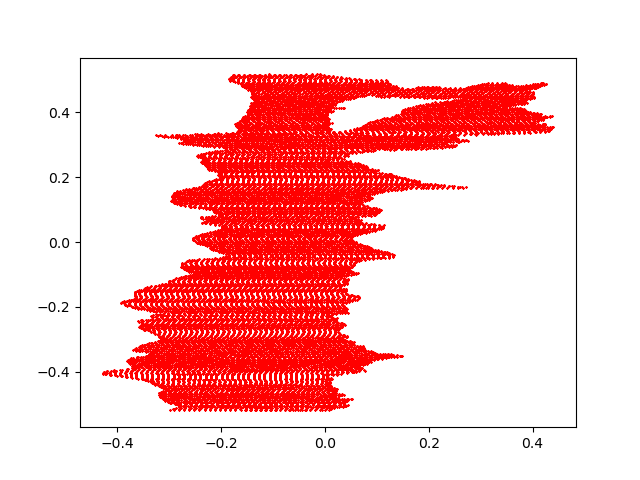

In [18]:
# plot the transformed mesh points 
plt.plot(krig_mesh.transformed_mesh_df.x_mesh, 
         krig_mesh.transformed_mesh_df.y_mesh, 'r*', markersize=1.25)
plt.show()

## Compute biomass density Semi-Variogram and fit a model

* Compute the normalized semi-variogram using the areal biomass density
* Fit a model to the semi-variogram values

### Compute the semi-variogram

#### Initialize semi-variogram calculation
* Transformed transect points
* Parameters specific to semi-variogram algorithm

In [19]:
semi_vario = survey_2019.get_semi_variogram(
    krig_mesh,
    params=dict(nlag=30, lag_res=0.002)
)

#### Compute the normalized semi-variogram

In [20]:
%%time
semi_vario.calculate_semi_variogram()

CPU times: user 3.8 s, sys: 3.03 s, total: 6.83 s
Wall time: 4.43 s


### Fit a model to the semi-variogram

* A widget to easily fit the model

In [21]:
semi_vario.get_widget()

GridspecLayout(children=(Dropdown(description='Semi-variogram model', index=1, layout=Layout(grid_area='widget…

## Perform Ordinary Kriging of biomass density

* transformed mesh points
* semi-variogram model
* areal biomass density 

### Initialize Kriging routine

In [22]:
kriging_params = dict(
    # kriging parameters
    k_max=10,
    k_min=3,
    R=0.0226287,
    ratio=0.001,
    
    # parameters for semi-variogram model
    s_v_params={'nugget': 0.0, 'sill': 0.95279, 'ls': 0.0075429,
                'exp_pow': 1.5, 'ls_hole_eff': 0.0},
    
    # grab appropriate semi-variogram model
    s_v_model=SV.generalized_exp_bessel
)

# uncomment to use widget values 
# kriging_params.update(semi_vario.get_params_for_kriging())

# initalize kriging routine
krig = survey_2019.get_kriging(kriging_params)

### Perform Kriging

* Generates total biomass at mesh points
* Computes the total biomass estimate of Kriging output in kmt, where kmt is $10^3$ metric tons, which is equivalent to $10^6$ kg

In [23]:
%%time
krig.run_biomass_kriging(krig_mesh)

CPU times: user 5.07 s, sys: 6.15 s, total: 11.2 s
Wall time: 6.42 s


In [24]:
# compute variables at the Kriging mesh points
krig.compute_kriging_variables()

### Compute abundance and biomass for each length and age bin, over mesh points

In [25]:
survey_2019.compute_length_age_variables(data="kriging")

In [26]:
survey_2019.bio_calc.kriging_bin_abundance_male_df.head()

,age_bin_1,age_bin_2,age_bin_3,age_bin_4,age_bin_5,age_bin_6,age_bin_7,age_bin_8,age_bin_9,age_bin_10,...,age_bin_14,age_bin_15,age_bin_16,age_bin_17,age_bin_18,age_bin_19,age_bin_20,age_bin_21,age_bin_22,un-aged
len_bin_2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
len_bin_4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
len_bin_6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
len_bin_8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
len_bin_10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [27]:
survey_2019.bio_calc.kriging_bin_biomass_df.head()

,age_bin_1,age_bin_2,age_bin_3,age_bin_4,age_bin_5,age_bin_6,age_bin_7,age_bin_8,age_bin_9,age_bin_10,...,age_bin_14,age_bin_15,age_bin_16,age_bin_17,age_bin_18,age_bin_19,age_bin_20,age_bin_21,age_bin_22,un-aged
len_bin_2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
len_bin_4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
len_bin_6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
len_bin_8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
len_bin_10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Convert biomass estimate to kmt and display results

In [28]:
# create variables to improve readability
krig_results = survey_2019.bio_calc.kriging_results_gdf
krig_results_male = survey_2019.bio_calc.kriging_results_male_gdf
krig_results_female = survey_2019.bio_calc.kriging_results_female_gdf

In [29]:
# convert to kmt
krig_results.biomass_adult = 1e-6 * krig_results.biomass_adult
krig_results_male.biomass_adult = 1e-6 * krig_results_male.biomass_adult
krig_results_female.biomass_adult = 1e-6 * krig_results_female.biomass_adult

In [30]:
# compute and display total biomass estimates 
print("Kriged Adult Biomass Estimates:")
print(f"Total: {krig_results.biomass_adult.sum():.3f} kmt")
print(f"Total Male: {krig_results_male.biomass_adult.sum():.3f} kmt")
print(f"Total Female: {krig_results_female.biomass_adult.sum():.3f} kmt")

Kriged Adult Biomass Estimates:
Total: 1725.033 kmt
Total Male: 834.250 kmt
Total Female: 890.783 kmt


### Plot Kriged Biomass estimate in kmt

Here we use the argument `greater_than_0=True` to limit the mesh biomass points that are plotted to ones with biomass value > 0, to prevent this notebook from getting too big. To plot all mesh points, omit the `greater_than_0` argument or use `greater_than_0=False`.

In [31]:
plot_kriging_results(krig_results, krig_field_name="biomass_adult", greater_than_0=True)